In [1]:
import pandas as pd
from prophet import Prophet
import os
import plotly.graph_objects as go

In [2]:
os.chdir("/Users/abyvelazquez/Developer/Repos/DS_Projects/Criminalidad/data/")
data_set = pd.read_csv("data_preparation.csv")

In [3]:
data_set.head()

,idCarpeta,Delito,riesgo_delito,Sexo,Edad,rango_edad,TipoPersona,CalidadJuridica,Mes_hecho,FechaHecho,Dias_transcurridos,count_semanas,HoraHecho,HoraInicio,poblacion_alcaldia,alcaldia_hechos
0,8324429.0,FRAUDE,5,Masculino,62.0,Adultos mayores,FISICA,OFENDIDO,Agosto,29/08/2018,128,974,12:00,12:19,759137,ALVARO OBREGON
1,8324430.0,"PRODUCCIÓN, IMPRESIÓN, ENAJENACIÓN, DISTRIBUCI...",8,Femenino,38.0,Adultos jóvenes,FISICA,VICTIMA Y DENUNCIANTE,Diciembre,15/12/2018,20,990,15:00,12:20,432205,AZCAPOTZALCO
2,8324431.0,ROBO A TRANSEUNTE SALIENDO DEL BANCO CON VIOLE...,10,Masculino,42.0,Adultos de mediana edad,FISICA,VICTIMA Y DENUNCIANTE,Diciembre,22/12/2018,13,991,15:30,12:23,614447,COYOACAN
3,8324435.0,ROBO DE VEHICULO DE SERVICIO PARTICULAR SIN VI...,3,Masculino,35.0,Adultos jóvenes,FISICA,VICTIMA Y DENUNCIANTE,Enero,04/01/2019,0,992,06:00,12:27,404695,IZTACALCO
4,8324438.0,ROBO DE MOTOCICLETA SIN VIOLENCIA,3,Masculino,39.0,Adultos jóvenes,FISICA,VICTIMA,Enero,03/01/2019,1,992,20:00,12:35,1835486,IZTAPALAPA


In [4]:
data_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 961666 entries, 0 to 961665
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   idCarpeta           961666 non-null  float64
 1   Delito              961666 non-null  object 
 2   riesgo_delito       961666 non-null  int64  
 3   Sexo                961666 non-null  object 
 4   Edad                961666 non-null  float64
 5   rango_edad          961666 non-null  object 
 6   TipoPersona         961666 non-null  object 
 7   CalidadJuridica     961666 non-null  object 
 8   Mes_hecho           961666 non-null  object 
 9   FechaHecho          961666 non-null  object 
 10  Dias_transcurridos  961666 non-null  int64  
 11  count_semanas       961666 non-null  int64  
 12  HoraHecho           961666 non-null  object 
 13  HoraInicio          961666 non-null  object 
 14  poblacion_alcaldia  961666 non-null  int64  
 15  alcaldia_hechos     961666 non-nul

In [5]:
data_set[["FechaHecho"]] = data_set[["FechaHecho"]].apply(pd.to_datetime)

/var/folders/30/qpjmvdzs0ng9dh1bzzwc7brh0000gn/T/ipykernel_70741/1220358193.py:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  data_set[["FechaHecho"]] = data_set[["FechaHecho"]].apply(pd.to_datetime)


In [6]:
fecha_delitos = data_set.groupby(data_set['FechaHecho'].dt.date).size().reset_index(name='Conteo')
# tambien limitamos la fecha delitos a los anios 2019, 2020, 2021, y 2022
fecha_delitos["FechaHecho"] = fecha_delitos["FechaHecho"].astype("datetime64")
fecha_delitos = fecha_delitos.loc[(fecha_delitos['FechaHecho'] >= '2019-01-01')]

In [7]:
data_set.loc[data_set['FechaHecho'] == "2022-12-27"].count()

idCarpeta             405
Delito                405
riesgo_delito         405
Sexo                  405
Edad                  405
rango_edad            405
TipoPersona           405
CalidadJuridica       405
Mes_hecho             405
FechaHecho            405
Dias_transcurridos    405
count_semanas         405
HoraHecho             405
HoraInicio            405
poblacion_alcaldia    405
alcaldia_hechos       405
dtype: int64

In [8]:
fecha_delitos.tail()

,FechaHecho,Conteo
4836,2022-12-27,405
4837,2022-12-28,384
4838,2022-12-29,340
4839,2022-12-30,261
4840,2022-12-31,132


Con esto comprobamos que si esta agrupando de manera correcta, con 405 delitos cometidos en diciembre del 2022

In [9]:
fecha_delitos_alcaldias = data_set.groupby([data_set['FechaHecho'].dt.date, "alcaldia_hechos"]).size().reset_index(name='Conteo')

In [10]:
fecha_delitos_alcaldias

,FechaHecho,alcaldia_hechos,Conteo
0,2000-01-01,CUAUHTEMOC,4
1,2000-01-01,GUSTAVO A. MADERO,1
2,2000-01-01,IZTACALCO,1
3,2000-01-01,IZTAPALAPA,2
4,2000-01-01,XOCHIMILCO,1
...,...,...,...
34037,2022-12-31,MILPA ALTA,1
34038,2022-12-31,TLAHUAC,3
34039,2022-12-31,TLALPAN,2
34040,2022-12-31,VENUSTIANO CARRANZA,9


Como tenemos delitos cometidos desde el 2001, para los modelos predictivos y que tomen en cuenta los ciclos por año necesita, vemos un histograma de el numero de delitos por año, y vemos que existe un valor similar en el 2019, 2020, 2021, 2022, por lo que puede considerar los ultimos 4 años para predecir el futuro es una buena estrategia.

<Axes: xlabel='FechaHecho'>

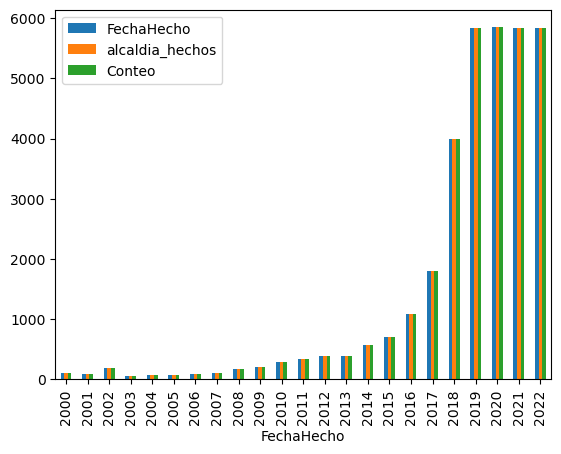

In [11]:
fecha_delitos_alcaldias["FechaHecho"] = fecha_delitos_alcaldias["FechaHecho"].astype("datetime64")
fecha_delitos_alcaldias.groupby(fecha_delitos_alcaldias["FechaHecho"].dt.year).count().plot(kind="bar")

In [12]:
fecha_delitos_alcaldias = fecha_delitos_alcaldias.loc[(fecha_delitos_alcaldias['FechaHecho'] >= '2019-01-01')]

In [13]:
print(fecha_delitos_alcaldias["alcaldia_hechos"].unique())

['ALVARO OBREGON' 'AZCAPOTZALCO' 'BENITO JUAREZ' 'COYOACAN'
 'CUAJIMALPA DE MORELOS' 'CUAUHTEMOC' 'GUSTAVO A. MADERO' 'IZTACALCO'
 'IZTAPALAPA' 'LA MAGDALENA CONTRERAS' 'MIGUEL HIDALGO' 'MILPA ALTA'
 'TLAHUAC' 'TLALPAN' 'VENUSTIANO CARRANZA' 'XOCHIMILCO']


Haremos un modelo con prophet para cada alcaldia, para si evaluar diferentes patrones en los datos y ver una estimacion de delitos por alcaldia

### Para Alcaldia Alvaro Obregon

In [14]:
fecha_delitos_alvaro_obregon = fecha_delitos_alcaldias.loc[fecha_delitos_alcaldias['alcaldia_hechos'] == "ALVARO OBREGON"]
fecha_delitos_alvaro_obregon=fecha_delitos_alvaro_obregon.drop('alcaldia_hechos', axis=1)
fecha_delitos_alvaro_obregon.rename(columns = {'FechaHecho':'ds', 'Conteo':'y'}, inplace = True)
fecha_delitos_alvaro_obregon.head()

,ds,y
10673,2019-01-01,56
10689,2019-01-02,79
10705,2019-01-03,45
10721,2019-01-04,61
10737,2019-01-05,59


In [15]:
m_alvaro_obregon = Prophet()
m_alvaro_obregon.fit(fecha_delitos_alvaro_obregon)

10:37:39 - cmdstanpy - INFO - Chain [1] start processing
10:37:39 - cmdstanpy - INFO - Chain [1] done processing


In [16]:
# Hacemos un dataframe de fechas futuras
future_alvaro_obregon = m_alvaro_obregon.make_future_dataframe(periods=365)
future_alvaro_obregon.tail()

,ds
1821,2023-12-27
1822,2023-12-28
1823,2023-12-29
1824,2023-12-30
1825,2023-12-31


In [17]:
forecast_alvaro_obregon = m_alvaro_obregon.predict(future_alvaro_obregon)
forecast_alvaro_obregon[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1821,2023-12-27,31.370305,18.358248,43.498329
1822,2023-12-28,31.825898,18.947074,44.184237
1823,2023-12-29,33.764017,21.150074,46.261965
1824,2023-12-30,30.212814,19.092405,43.329360
1825,2023-12-31,30.070744,18.074059,42.285834


In [18]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m_alvaro_obregon, forecast_alvaro_obregon)

In [19]:
plot_components_plotly(m_alvaro_obregon, forecast_alvaro_obregon)

## Para Alcaldia Azcapotzalco

In [20]:
fecha_delitos_azcapotzalco = fecha_delitos_alcaldias.loc[fecha_delitos_alcaldias['alcaldia_hechos'] ==
                                                         "AZCAPOTZALCO"]
fecha_delitos_azcapotzalco=fecha_delitos_azcapotzalco.drop('alcaldia_hechos', axis=1)
fecha_delitos_azcapotzalco.rename(columns = {'FechaHecho':'ds', 'Conteo':'y'}, inplace = True)
fecha_delitos_azcapotzalco.head()

,ds,y
10674,2019-01-01,29
10690,2019-01-02,52
10706,2019-01-03,36
10722,2019-01-04,44
10738,2019-01-05,34


In [21]:
m_azcapotzalco = Prophet()
m_azcapotzalco.fit(fecha_delitos_azcapotzalco)

10:37:41 - cmdstanpy - INFO - Chain [1] start processing
10:37:41 - cmdstanpy - INFO - Chain [1] done processing


In [22]:
# Hacemos un dataframe de fechas futuras
future_azcapotzalco = m_azcapotzalco.make_future_dataframe(periods=365)
future_azcapotzalco.tail()

,ds
1821,2023-12-27
1822,2023-12-28
1823,2023-12-29
1824,2023-12-30
1825,2023-12-31


In [23]:
forecast_azcapotzalco = m_azcapotzalco.predict(future_azcapotzalco)
forecast_azcapotzalco[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1821,2023-12-27,26.471974,16.359202,36.231578
1822,2023-12-28,26.330372,16.596974,36.065032
1823,2023-12-29,27.538392,17.641420,37.340244
1824,2023-12-30,24.942665,15.169459,33.996904
1825,2023-12-31,24.503692,15.331272,34.096873


In [24]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m_azcapotzalco, forecast_azcapotzalco)

In [25]:
plot_components_plotly(m_azcapotzalco, forecast_azcapotzalco)

## Para Alcaldia Benito Juarez

In [26]:
fecha_delitos_benito_juarez = fecha_delitos_alcaldias.loc[fecha_delitos_alcaldias['alcaldia_hechos'] ==
                                                         "BENITO JUAREZ"]
fecha_delitos_benito_juarez=fecha_delitos_benito_juarez.drop('alcaldia_hechos', axis=1)
fecha_delitos_benito_juarez.rename(columns = {'FechaHecho':'ds', 'Conteo':'y'}, inplace = True)
fecha_delitos_benito_juarez.head()

,ds,y
10675,2019-01-01,36
10691,2019-01-02,87
10707,2019-01-03,77
10723,2019-01-04,89
10739,2019-01-05,86


In [27]:
m_benito_juarez = Prophet()
m_benito_juarez.fit(fecha_delitos_benito_juarez)

10:37:42 - cmdstanpy - INFO - Chain [1] start processing
10:37:42 - cmdstanpy - INFO - Chain [1] done processing


In [28]:
# Hacemos un dataframe de fechas futuras
future_benito_juarez = m_benito_juarez.make_future_dataframe(periods=365)
future_benito_juarez.tail()

,ds
1821,2023-12-27
1822,2023-12-28
1823,2023-12-29
1824,2023-12-30
1825,2023-12-31


In [29]:
forecast_benito_juarez = m_benito_juarez.predict(future_benito_juarez)
forecast_benito_juarez[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1821,2023-12-27,32.546187,17.306919,47.840392
1822,2023-12-28,33.729427,17.451252,50.257997
1823,2023-12-29,35.816093,20.017040,51.802130
1824,2023-12-30,26.537661,10.991897,41.806627
1825,2023-12-31,24.091896,8.132178,39.668609


In [30]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m_benito_juarez, forecast_benito_juarez)

In [31]:
plot_components_plotly(m_benito_juarez, forecast_benito_juarez)

## Para Alcaldia Coyoacan

In [32]:
fecha_delitos_coyoacan = fecha_delitos_alcaldias.loc[fecha_delitos_alcaldias['alcaldia_hechos'] ==
                                                         "COYOACAN"]
fecha_delitos_coyoacan=fecha_delitos_coyoacan.drop('alcaldia_hechos', axis=1)
fecha_delitos_coyoacan.rename(columns = {'FechaHecho':'ds', 'Conteo':'y'}, inplace = True)
fecha_delitos_coyoacan.head()

,ds,y
10676,2019-01-01,35
10692,2019-01-02,60
10708,2019-01-03,55
10724,2019-01-04,48
10740,2019-01-05,45


In [33]:
m_coyoacan = Prophet()
m_coyoacan.fit(fecha_delitos_coyoacan)

10:37:43 - cmdstanpy - INFO - Chain [1] start processing
10:37:43 - cmdstanpy - INFO - Chain [1] done processing


In [34]:
# Hacemos un dataframe de fechas futuras
future_coyoacan = m_coyoacan.make_future_dataframe(periods=365)
future_coyoacan.tail()

,ds
1821,2023-12-27
1822,2023-12-28
1823,2023-12-29
1824,2023-12-30
1825,2023-12-31


In [35]:
forecast_coyoacan = m_coyoacan.predict(future_coyoacan)
forecast_coyoacan[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1821,2023-12-27,43.698918,32.256822,55.535624
1822,2023-12-28,44.621119,32.243698,56.032342
1823,2023-12-29,46.417913,35.336634,58.891516
1824,2023-12-30,43.319657,31.312947,55.512157
1825,2023-12-31,42.109696,29.960963,54.982255


In [36]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m_coyoacan, forecast_coyoacan)

In [37]:
plot_components_plotly(m_coyoacan, forecast_coyoacan)

## Para Alcaldia Cuajimalpa de Morelos

In [38]:
fecha_delitos_cuajimalpa = fecha_delitos_alcaldias.loc[fecha_delitos_alcaldias['alcaldia_hechos'] ==
                                                         "CUAJIMALPA DE MORELOS"]
fecha_delitos_cuajimalpa=fecha_delitos_cuajimalpa.drop('alcaldia_hechos', axis=1)
fecha_delitos_cuajimalpa.rename(columns = {'FechaHecho':'ds', 'Conteo':'y'}, inplace = True)
fecha_delitos_cuajimalpa.head()

,ds,y
10677,2019-01-01,12
10693,2019-01-02,10
10709,2019-01-03,22
10725,2019-01-04,18
10741,2019-01-05,11


In [39]:
m_cuajimalpa = Prophet()
m_cuajimalpa.fit(fecha_delitos_cuajimalpa)

10:37:44 - cmdstanpy - INFO - Chain [1] start processing
10:37:44 - cmdstanpy - INFO - Chain [1] done processing


In [40]:
# Hacemos un dataframe de fechas futuras
future_cuajimalpa = m_cuajimalpa.make_future_dataframe(periods=365)
future_cuajimalpa.tail()

,ds
1821,2023-12-27
1822,2023-12-28
1823,2023-12-29
1824,2023-12-30
1825,2023-12-31


In [41]:
forecast_cuajimalpa = m_cuajimalpa.predict(future_cuajimalpa)
forecast_cuajimalpa[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1821,2023-12-27,9.506952,4.689144,14.231401
1822,2023-12-28,9.743674,4.643892,14.759805
1823,2023-12-29,10.536640,5.608489,15.803630
1824,2023-12-30,9.910433,5.206445,14.900172
1825,2023-12-31,9.983487,5.208551,14.795145


In [42]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m_cuajimalpa, forecast_cuajimalpa)

In [43]:
plot_components_plotly(m_cuajimalpa, forecast_cuajimalpa)

## Para Alcaldia Cuauhtemoc

In [44]:
fecha_delitos_cuauhtemoc = fecha_delitos_alcaldias.loc[fecha_delitos_alcaldias['alcaldia_hechos'] ==
                                                         "CUAUHTEMOC"]
fecha_delitos_cuauhtemoc=fecha_delitos_cuauhtemoc.drop('alcaldia_hechos', axis=1)
fecha_delitos_cuauhtemoc.rename(columns = {'FechaHecho':'ds', 'Conteo':'y'}, inplace = True)
fecha_delitos_cuauhtemoc.head()

,ds,y
10678,2019-01-01,113
10694,2019-01-02,148
10710,2019-01-03,168
10726,2019-01-04,167
10742,2019-01-05,117


In [45]:
m_cuauhtemoc = Prophet()
m_cuauhtemoc.fit(fecha_delitos_cuauhtemoc)

10:37:46 - cmdstanpy - INFO - Chain [1] start processing
10:37:46 - cmdstanpy - INFO - Chain [1] done processing


In [46]:
# Hacemos un dataframe de fechas futuras
future_cuauhtemoc = m_cuauhtemoc.make_future_dataframe(periods=365)
future_cuauhtemoc.tail()

,ds
1821,2023-12-27
1822,2023-12-28
1823,2023-12-29
1824,2023-12-30
1825,2023-12-31


In [47]:
forecast_cuauhtemoc = m_cuauhtemoc.predict(future_cuauhtemoc)
forecast_cuauhtemoc[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1821,2023-12-27,78.160737,47.511582,106.971033
1822,2023-12-28,81.332379,50.041943,111.321340
1823,2023-12-29,84.511358,56.254726,115.147822
1824,2023-12-30,69.425334,37.555543,99.453419
1825,2023-12-31,61.524175,33.527845,93.033058


In [48]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m_cuauhtemoc, forecast_cuauhtemoc)

In [49]:
plot_components_plotly(m_cuauhtemoc, forecast_cuauhtemoc)

## Para Alcaldia Gustavo A. Madero

In [50]:
fecha_delitos_gustavo_madero = fecha_delitos_alcaldias.loc[fecha_delitos_alcaldias['alcaldia_hechos'] ==
                                                         "GUSTAVO A. MADERO"]
fecha_delitos_gustavo_madero=fecha_delitos_gustavo_madero.drop('alcaldia_hechos', axis=1)
fecha_delitos_gustavo_madero.rename(columns = {'FechaHecho':'ds', 'Conteo':'y'}, inplace = True)
fecha_delitos_gustavo_madero.head()

,ds,y
10679,2019-01-01,63
10695,2019-01-02,69
10711,2019-01-03,108
10727,2019-01-04,114
10743,2019-01-05,85


In [51]:
m_gustavo_madero = Prophet()
m_gustavo_madero.fit(fecha_delitos_gustavo_madero)

10:37:47 - cmdstanpy - INFO - Chain [1] start processing
10:37:47 - cmdstanpy - INFO - Chain [1] done processing


In [52]:
# Hacemos un dataframe de fechas futuras
future_gustavo_madero = m_gustavo_madero.make_future_dataframe(periods=365)
future_gustavo_madero.tail()

,ds
1821,2023-12-27
1822,2023-12-28
1823,2023-12-29
1824,2023-12-30
1825,2023-12-31


In [53]:
forecast_gustavo_madero = m_gustavo_madero.predict(future_gustavo_madero)
forecast_gustavo_madero[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1821,2023-12-27,50.291246,35.273036,65.878427
1822,2023-12-28,50.367989,34.226156,65.222038
1823,2023-12-29,52.378582,37.752760,67.904189
1824,2023-12-30,48.104427,33.631367,63.511707
1825,2023-12-31,48.280858,33.226876,63.337621


In [54]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m_gustavo_madero, forecast_gustavo_madero)

In [55]:
plot_components_plotly(m_gustavo_madero, forecast_gustavo_madero)